# Final Report


#### Goal: 
Our project aims to use Python and data mining techniques on a heart failure prediction dataset. With attributes like age, sex, ChestPainType, RestingBP, Cholesterol, FastingBS, RestingECG, MaxHR, ExerciseAngina, Oldpeak, ST_Slope, and HeartDisease, we'll preprocess the data, apply different mining techniques, compare results, and share our findings on a GitHub repository with Jupyter notebooks. The focus is on creating effective models for heart failure prediction.

## 1-Problem
There is global rise in heart diseases, resulting in increased death rates. Early detection of symptoms is important for preventing the disease progression and reducing early deaths. Our project aims to analyze patient data to identify subtle symptoms that may go unnoticed as signs of heart disease. This analysis will enable us to predict the likelihood of a heart attack, allowing individuals to take preventive measures effectively.

## 2-Data mining Task
In our project we will use two data mining tasks to help us predict the possibility of having heart disease  which are classification and clustering. For classification we will train our model to be able to classify if the patient has heart diseases or not using (heartdisease) class based on a set of medical examinations like age, cholestrol, ChestPainType,maxHR etc. For the clustering our model will create a set of clusters for the patient who have similar characteristics, then these clusters will be used to predict new patients’ results.


## 3-Data

#### Source of dataset:
the source of dataset is kaggle. [Link] (https://www.kaggle.com/datasets/fedesoriano/heart-failure-prediction) .

#### General information:
our dataset contains 12 attributes and 918 objects and the type of attributes are:

| Attribute       | Description                                                                             | Data Type        |
|-----------------|-----------------------------------------------------------------------------------------|------------------|
| Age             | Age of the patient [range between 28 to 77]                                                              | Numeric (Integer)|
| Sex             | Sex of the patient [M: Male, F: Female]                                                | Categorical      |
| ChestPainType   | Chest pain type [TA: Typical Angina, ATA: Atypical Angina, NAP: Non-Anginal Pain, ASY: Asymptomatic] | Categorical      |
| RestingBP       | Resting blood pressure [range between 0 to 200]                                                         | Numeric (Integer)|
| Cholesterol     | Serum cholesterol [range between 0 to 603]                                                              | Numeric (Integer)|
| FastingBS       | Fasting blood sugar [1: if FastingBS > 120 mg/dl, 0: otherwise]                         | Categorical      |
| RestingECG      | Resting electrocardiogram results [Normal: Normal, ST: ST-T wave abnormality, LVH: Left ventricular hypertrophy] | Categorical      |
| MaxHR           | Maximum heart rate achieved [range between 60 to 202]                          | Numeric (Integer)|
| ExerciseAngina  | Exercise-induced angina [Y: Yes, N: No]                                                | Categorical      |
| Oldpeak         | Oldpeak = ST depression [Numeric value measured in depression]                          | Numeric (Float)  |
| ST_Slope        | Slope of the peak exercise ST segment [Up: upsloping, Flat: flat, Down: downsloping]     | Categorical      |
| HeartDisease    | Output class [1: heart disease, 0: Normal]                                             | Categorical      |

class label: HeartDisease (occurence of heart disease and not occurance) 

In [3]:
import piplite
await piplite.install('seaborn')

In [4]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

## reading the data and view first five row of dataSet
df = pd.read_csv("heart.csv")
df.head()

,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ST_Slope,HeartDisease
0,40,M,ATA,140,289,0,Normal,172,N,0.0,Up,0
1,49,F,NAP,160,180,0,Normal,156,N,1.0,Flat,1
2,37,M,ATA,130,283,0,ST,98,N,0.0,Up,0
3,48,F,ASY,138,214,0,Normal,108,Y,1.5,Flat,1
4,54,M,NAP,150,195,0,Normal,122,N,0.0,Up,0


In [5]:
## number of row (objects)
NR=df.shape[0]
print (NR)

918


In [6]:
## number of columns (attribute)
NC=df.shape[1]
print (NC)

12


#### graphs:

#### -Boxplot:

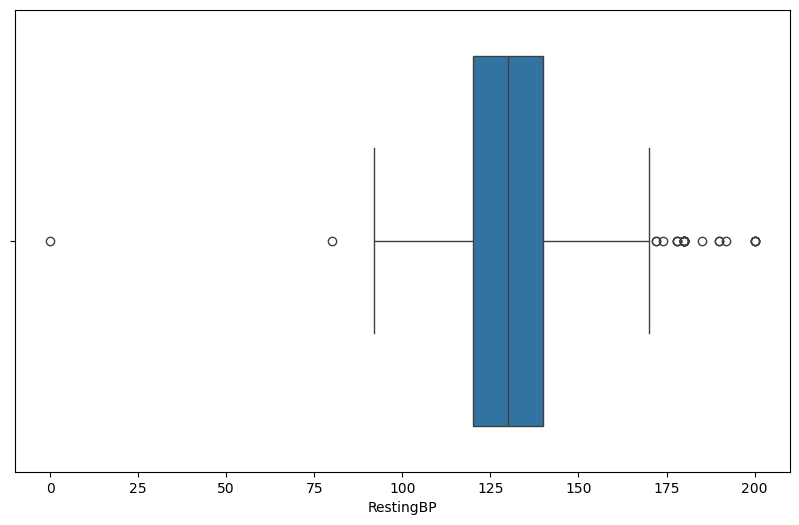

In [7]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='RestingBP', data=df)
plt.show()

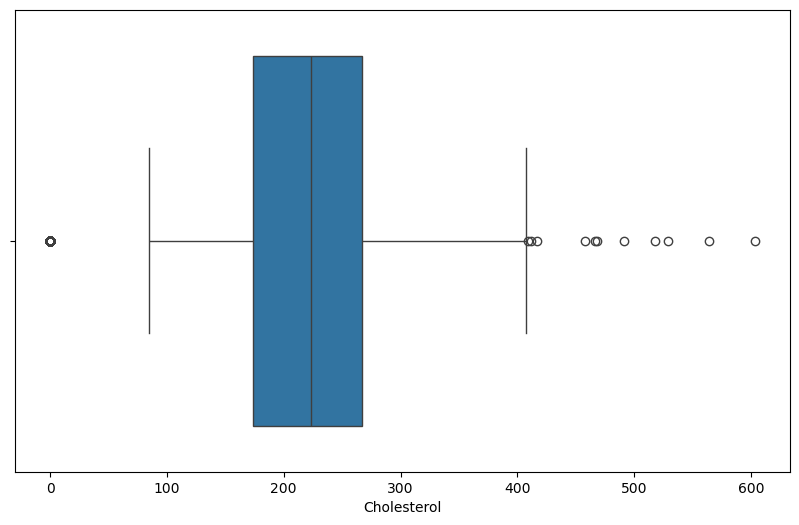

In [8]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='Cholesterol', data=df)
plt.show()

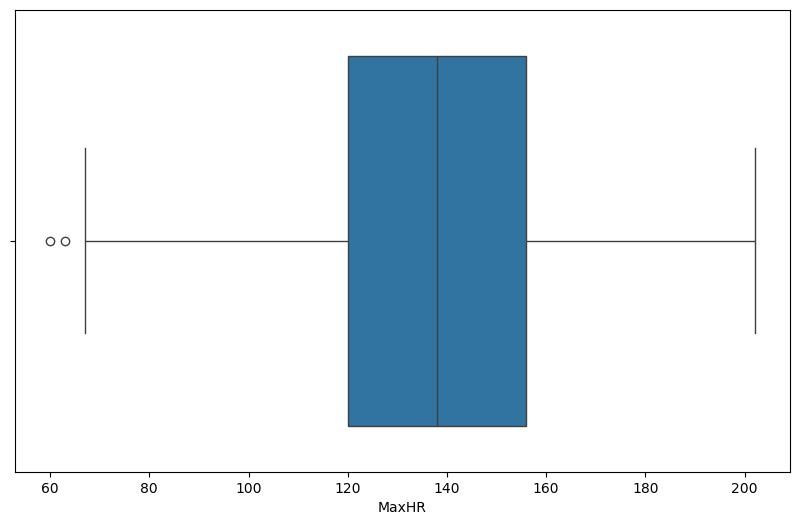

In [9]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='MaxHR', data=df)
plt.show()

These boxplots provide a concise summary of the distribution, central tendency, and potential outliers for the respective physiological measures in our dataset, After plotting the data using box plots, it's clear that there are outliers in all the attributes.

#### -Histogram:


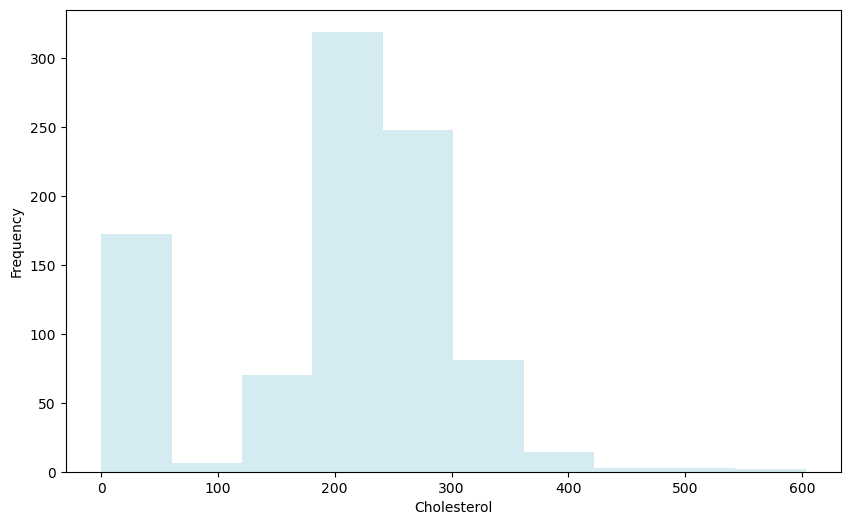

In [10]:
plt.figure(figsize=(10, 6))
plt.hist(df['Cholesterol'], color='lightblue', alpha=0.5)
plt.xlabel('Cholesterol')
plt.ylabel('Frequency')
plt.show()


The histogram represents the distribution of cholesterol levels ('Cholesterol') in the dataset. The x-axis displays different ranges of cholesterol values, while the y-axis represents the frequency of occurrences ,Cholesterol levels in the range of 0-80 have more than 160 occurrences. ,The range from 110 to 190 has approximately 70 occurrences,Cholesterol levels in the range of 190 to more than 240 have more than 300 occurrences ,The range from 140 to 300 has 250 occurrences,Cholesterol levels in the range of 300 to more than 350 have more than 150 occurrences.
The range from 350 to 410 has 10 occurrences.

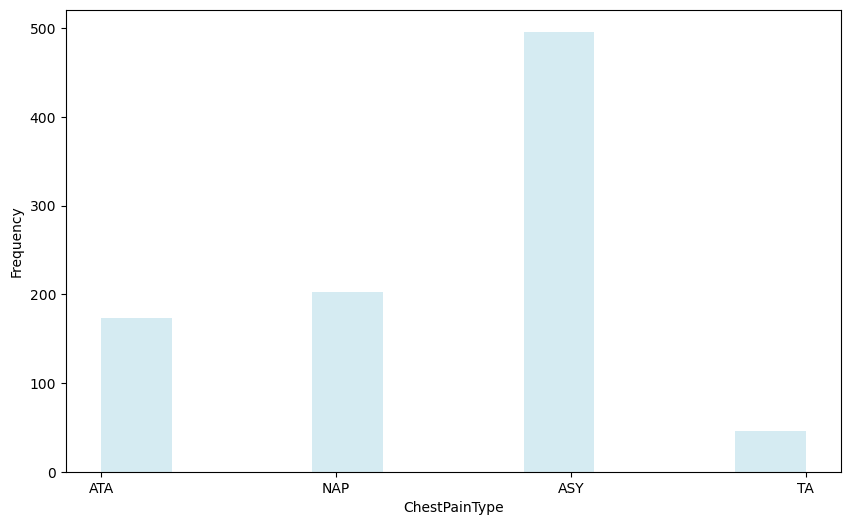

In [11]:
plt.figure(figsize=(10, 6))
plt.hist(df['ChestPainType'], color='lightblue', alpha=0.5)
plt.xlabel('ChestPainType')
plt.ylabel('Frequency')
plt.show()

The histogram illustrates the distribution of different chest pain types ('ChestPainType') in the dataset. Each bar corresponds to a specific chest pain type, and the height of the bars indicates the frequency of occurrences ,"ATA" has more than 180 occurrences.
"NAP" has more than 200 occurrences,"ASY" has approximately 500 occurrences,"TA" has approximately 50 occurrences.
This visualization allows for a quick comparison of the prevalence of each chest pain type, providing insights into the distribution and relative frequencies within the dataset.

#### -pieChart:

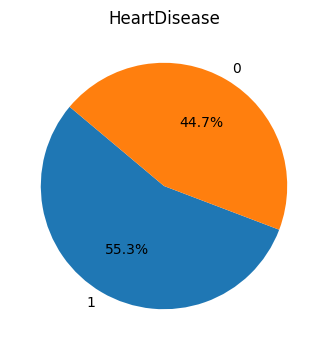

In [12]:

HeartDisease_groups = df['HeartDisease'].value_counts()

plt.figure(figsize=(4, 4))
plt.pie(HeartDisease_groups, labels=HeartDisease_groups.index, autopct='%1.1f%%', startangle=140)
plt.title('HeartDisease')
plt.show()


"0" constitutes 44.7% of the cases which refers to people who do not suffer from heart disease,"1" accounts for 55.3% which refers to people who suffer from heart disease.

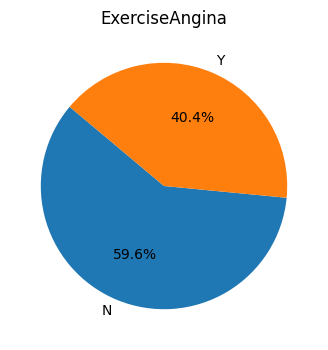

In [13]:
ExerciseAngina_groups = df['ExerciseAngina'].value_counts()

plt.figure(figsize=(4, 4))
plt.pie(ExerciseAngina_groups, labels=ExerciseAngina_groups.index, autopct='%1.1f%%', startangle=140)
plt.title('ExerciseAngina')
plt.show()

In the pie chart, 44.4% of the cases are marked as "Yes" for exercise-induced angina, while 59.6% are labeled as "No." This means that a bit over 40% experience exercise-induced angina, while close to 60% do not. The chart gives a straightforward view of how these categories are distributed in the dataset, with a majority falling into the "No" category.

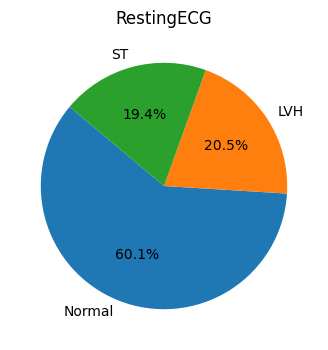

In [14]:
ExerciseAngina_groups = df['RestingECG'].value_counts()

plt.figure(figsize=(4, 4))
plt.pie(ExerciseAngina_groups, labels=ExerciseAngina_groups.index, autopct='%1.1f%%', startangle=140)
plt.title('RestingECG')
plt.show()

"ST" constitutes 19.4% of the cases,"LVH" accounts for 20.5%, "Normal" is the majority at 60.1%.
This clear visualization offers a quick overview of how electrocardiogram (ECG) results are categorized in the dataset, with the majority falling into the "Normal" category.

#### -Bar chart:

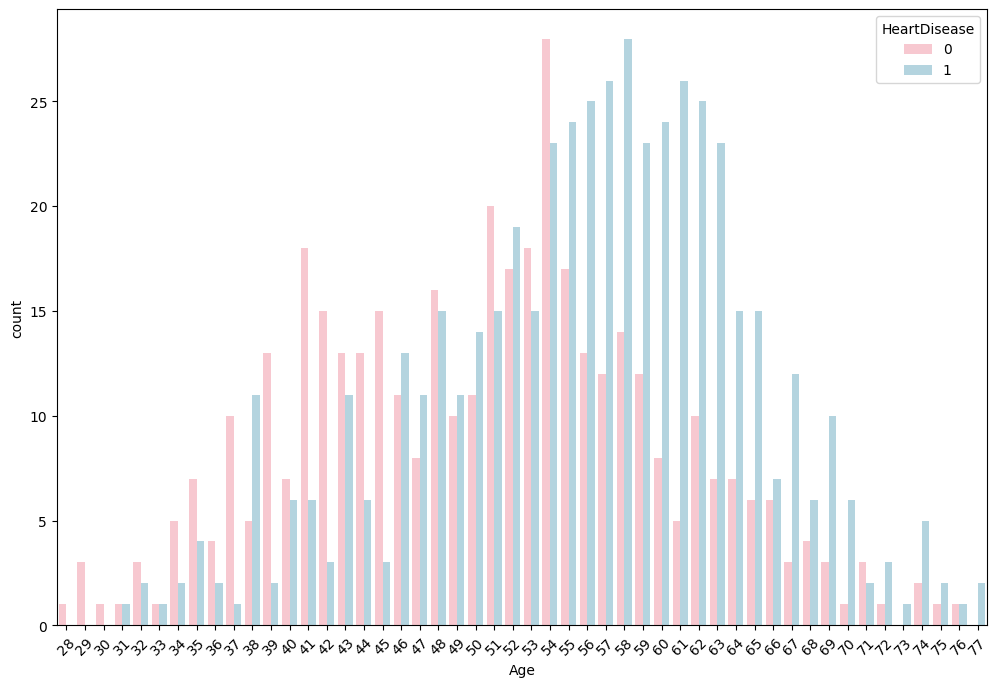

In [15]:
plt.figure(figsize=(12,8))
sns.countplot(x='Age', data=df, hue='HeartDisease',palette= ['pink','lightblue'])
plt.xlabel('Age')
plt.xticks(rotation=45)
plt.show()

The bar chart displays the distribution of 'HeartDisease' across different age groups in the dataset. Each bar represents an age category, and the height of the bars indicates the count of individuals in each group,  The chart allows for a quick comparison of heart disease prevalence among various age brackets, providing insights into potential age-related patterns.

## 4-Data preprocessing

In [16]:
##check missing values
missing_values=df.isna().sum()

print("Missing Values in each column:")
print(missing_values)

print("\nTotal number of missing values:" ,missing_values.sum())

Missing Values in each column:
Age               0
Sex               0
ChestPainType     0
RestingBP         0
Cholesterol       0
FastingBS         0
RestingECG        0
MaxHR             0
ExerciseAngina    0
Oldpeak           0
ST_Slope          0
HeartDisease      0
dtype: int64

Total number of missing values: 0


**Description**:We check missing value and we noticed that there is no missing value.

In [17]:
##display staticalsummaries such as mean amd variance

selected_columns = ['Age', 'RestingBP', 'Cholesterol', 'FastingBS', 'MaxHR', 'Oldpeak', 'HeartDisease']
selected_data = df[selected_columns]
central_tendency = selected_data.describe()
variance = selected_data.var()
central_tendency.loc['variance'] = variance
display(central_tendency)

,Age,RestingBP,Cholesterol,FastingBS,MaxHR,Oldpeak,HeartDisease
count,918.000000,918.000000,918.000000,918.000000,918.000000,918.000000,918.000000
mean,53.510893,132.396514,198.799564,0.233115,136.809368,0.887364,0.553377
std,9.432617,18.514154,109.384145,0.423046,25.460334,1.066570,0.497414
min,28.000000,0.000000,0.000000,0.000000,60.000000,-2.600000,0.000000
25%,47.000000,120.000000,173.250000,0.000000,120.000000,0.000000,0.000000
50%,54.000000,130.000000,223.000000,0.000000,138.000000,0.600000,1.000000
75%,60.000000,140.000000,267.000000,0.000000,156.000000,1.500000,1.000000
max,77.000000,200.000000,603.000000,1.000000,202.000000,6.200000,1.000000
variance,88.974254,342.773903,11964.891079,0.178968,648.228614,1.137572,0.247420


**Description**:we extracted the mean, standard deviation,min,max, medain, variance and etc in numeric attributes .

In [ ]:
specific_columns = ['Age', 'RestingBP', 'Cholesterol', 'FastingBS', 'MaxHR', 'Oldpeak']

# Set the outlier detection threshold
threshold = 2

for col in specific_columns:
    # Calculate mean and standard deviation for the specific column
    mean_specific = np.mean(df[col])
    std_dev_specific = np.std(df[col])

    # Detect outliers in the specific column
    outliers = [value for value in df[col] if abs(value - mean_specific) > threshold * std_dev_specific]

    # Print the outliers in the specific column
    print(f'Outliers in column {col}: {outliers}')

In [19]:
# Remove outlier

selected_columns = ['Age', 'RestingBP', 'Cholesterol', 'FastingBS', 'MaxHR', 'Oldpeak']

means = {col: np.mean(df[col]) for col in selected_columns}
std_devs = {col: np.std(df[col]) for col in selected_columns}

threshold = 2

# Filter out rows where any value in the selected columns falls outside the threshold range from the mean
df = df[~((np.abs(df[selected_columns] - df[selected_columns].mean()) > threshold * df[selected_columns].std()).any(axis=1))]

print(df)

     Age Sex ChestPainType  RestingBP  Cholesterol  FastingBS RestingECG  \
0     40   M           ATA        140          289          0     Normal   
1     49   F           NAP        160          180          0     Normal   
2     37   M           ATA        130          283          0         ST   
3     48   F           ASY        138          214          0     Normal   
4     54   M           NAP        150          195          0     Normal   
..   ...  ..           ...        ...          ...        ...        ...   
912   57   F           ASY        140          241          0     Normal   
913   45   M            TA        110          264          0     Normal   
915   57   M           ASY        130          131          0     Normal   
916   57   F           ATA        130          236          0        LVH   
917   38   M           NAP        138          175          0     Normal   

     MaxHR ExerciseAngina  Oldpeak ST_Slope  HeartDisease  
0      172              N  

**Description**:We calculates the mean and standard deviation for selected columns, then filters out rows where values fall outside a specified threshold range from the mean for those columns to produce more accurate dataset.

In [20]:
## Encoding catogrical data

from sklearn.preprocessing import LabelEncoder
from scipy import stats



le=LabelEncoder()

df['Sex'] = le.fit_transform(df['Sex'])
df['ChestPainType'] = le.fit_transform(df['ChestPainType'])
df['RestingECG'] = le.fit_transform(df['RestingECG'])
df['ExerciseAngina'] = le.fit_transform(df['ExerciseAngina'])
df['ST_Slope'] = le.fit_transform(df['ST_Slope'])

print(df)

     Age  Sex  ChestPainType  RestingBP  Cholesterol  FastingBS  RestingECG  \
0     40    1              1        140          289          0           1   
1     49    0              2        160          180          0           1   
2     37    1              1        130          283          0           2   
3     48    0              0        138          214          0           1   
4     54    1              2        150          195          0           1   
..   ...  ...            ...        ...          ...        ...         ...   
912   57    0              0        140          241          0           1   
913   45    1              3        110          264          0           1   
915   57    1              0        130          131          0           1   
916   57    0              1        130          236          0           0   
917   38    1              2        138          175          0           1   

     MaxHR  ExerciseAngina  Oldpeak  ST_Slope  Hear

**Description**:We extract non-numeric attributes which is (Sex,ChestPainType,RestingECG,ExerciseAngina,ST_Slope) and we encode it to numeric values ,so we can do
calculations on it

In [21]:
# Discretization

# Define the bins for discretization
bins = [28, 45, 60, 77]  # Define your custom age groups here

# Define the labels for the bins
labels = ['1', '2', '3']

# Create a new column with the age groups
df['Age'] = pd.cut(df['Age'], bins=bins, labels=labels, right=False)

print(df)

    Age  Sex  ChestPainType  RestingBP  Cholesterol  FastingBS  RestingECG  \
0     1    1              1        140          289          0           1   
1     2    0              2        160          180          0           1   
2     1    1              1        130          283          0           2   
3     2    0              0        138          214          0           1   
4     2    1              2        150          195          0           1   
..   ..  ...            ...        ...          ...        ...         ...   
912   2    0              0        140          241          0           1   
913   2    1              3        110          264          0           1   
915   2    1              0        130          131          0           1   
916   2    0              1        130          236          0           0   
917   1    1              2        138          175          0           1   

     MaxHR  ExerciseAngina  Oldpeak  ST_Slope  HeartDisease  
0

**Description**:We transformed the age into intervals to be fall on one of three possible interval labels which is 1, 2 and 3.

1 represent age from 28 to 44 

2 represent age from 45 to 59 

3 represent age from 60 and above 

By discretizing the values  well be meaningful and simpler to classify or perform other methods that can help us later in our model.

In [23]:
#Normalization
import pandas as pd
from sklearn.preprocessing import MinMaxScaler

columns_to_normalize = ['RestingBP', 'Cholesterol', 'MaxHR', 'Oldpeak']
data_to_normalize = df[columns_to_normalize]


minmax_scaler = MinMaxScaler()
normalized_data_minmax = minmax_scaler.fit_transform(data_to_normalize)


df[columns_to_normalize] = normalized_data_minmax


print(df)


    Age  Sex  ChestPainType  RestingBP  Cholesterol  FastingBS  RestingECG  \
0     1    1              1   0.637681     0.693046          0           1   
1     2    0              2   0.927536     0.431655          0           1   
2     1    1              1   0.492754     0.678657          0           2   
3     2    0              0   0.608696     0.513189          0           1   
4     2    1              2   0.782609     0.467626          0           1   
..   ..  ...            ...        ...          ...        ...         ...   
912   2    0              0   0.637681     0.577938          0           1   
913   2    1              3   0.202899     0.633094          0           1   
915   2    1              0   0.492754     0.314149          0           1   
916   2    0              1   0.492754     0.565947          0           0   
917   1    1              2   0.608696     0.419664          0           1   

     MaxHR  ExerciseAngina   Oldpeak  ST_Slope  HeartDisease  


**Description**:Normalization is where the attribute data are scaled so as to fall within a smaller range. We used
normalization to four attributes.

In [24]:
#Feature selection
import pandas as pd
from sklearn.feature_selection import RFE
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split

X = df.drop('HeartDisease', axis=1)  
y = df['HeartDisease']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

clf = RandomForestClassifier(random_state=42)

# Initialize the RFE with the classifier and the number of features to select
num_features_to_select = 10  # Replace with the desired number of features
rfe = RFE(estimator=clf, n_features_to_select=num_features_to_select)

# Fit the RFE on the training data
X_train_rfe = rfe.fit_transform(X_train, y_train)

# Get the selected feature indices
selected_indices = rfe.get_support(indices=True)

# Get the names of the selected features
selected_features = X.columns[selected_indices]

# Print the selected feature names
print("Selected Features:", selected_features)


Selected Features: Index(['Age', 'Sex', 'ChestPainType', 'RestingBP', 'Cholesterol', 'RestingECG',
       'MaxHR', 'ExerciseAngina', 'Oldpeak', 'ST_Slope'],
      dtype='object')


**Description**: we executed feature selection on a dataset aimed at predicting heart disease using Recursive Feature Elimination (RFE) combined with a RandomForestClassifier. The process involved separating the dataset into features and the target variable, splitting these into training and test sets, and then applying RFE to pinpoint the top ten most critical features. we did this method becouse it is effectively reduces the feature space, which can enhance the model's performance by focusing on the most informative attributes.

In [25]:
# Assuming 'preprocessed_data' is your preprocessed DataFrame
df.to_csv('3preprocessed_data.csv', index=False)

**Description**:we have here a file with the preprocessed data. 

## 5-Data Mining Technique

#### For classification:

 classificacation is superviesed learning and we used a decision tree it is a recursive algorithm generates a tree where 
leaf nodes representing the final decisions
 The model's primary function is to predict the class label (Heart Disease) based on the other attributes present and we extract the accuracy, sensitivity, specifity and precion by using confusion matrix.

This technique includes dividing the dataset into two sets:
- Training dataset: Used for building the decision tree.
- Testing dataset: Used to evaluate the constructed model.

The packeges we used sklearn,sklearn.model_selection,sklearn.metrics and matplotlib.pyplot.

the methods we used DecisionTreeClassifier(),fit(),predict(),train_test_split(),accuracy_score(),precision_score(),confusion_matrix(),from_estimator( ).

#### For clustring:
Clustering is an unsupervised learning technique used to group sets of objects in such a way that objects in the same group (called a cluster) are more similar to each other than to those in other groups. Our main goal was to identify distinct groups or segments within our dataset without prior labeling.

Technique Overview:
We utilized the K-means clustering algorithm. It partitions the dataset into K distinct, non-overlapping clusters based on their attributes to minimize the intra-cluster distances and maximize the inter-cluster distances.

 the Packages we Used:
 • sklearn,matplotlib.pyplot.

 The Methods we Employed:
 • KMeans(),fit(),predict(),silhouette_score(),PCA().

By employing these techniques and tools, we aim to uncover meaningful patterns and groupings in the dataset that can lead to insightful conclusions about the underlying structure of the data.



In [2]:
# split dataset in fetures and target variabal
fn=df.keys().tolist()[:-1]
X=df[fn]
y=df['HeartDisease']

In [1]:
# Load libraries
import pandas as pd
from sklearn.tree import DecisionTreeClassifier # Import Decision Tree Classifier
from sklearn.model_selection import train_test_split # Import train_test_split function
from sklearn import metrics #Import scikit-learn metrics module for accuracy calculation
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
import matplotlib.pyplot as plt
from sklearn import tree
import pandas as pd

df = pd.read_csv("3preprocessed_data.csv")
df.head()

,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ST_Slope,HeartDisease
0,1,1,1,0.637681,0.693046,0,1,0.86,0,0.268293,2,0
1,2,0,2,0.927536,0.431655,0,1,0.70,0,0.512195,1,1
2,1,1,1,0.492754,0.678657,0,2,0.12,0,0.268293,2,0
3,2,0,0,0.608696,0.513189,0,1,0.22,1,0.634146,1,1
4,2,1,2,0.782609,0.467626,0,1,0.36,0,0.268293,2,0


Description:we have here preprocessed data

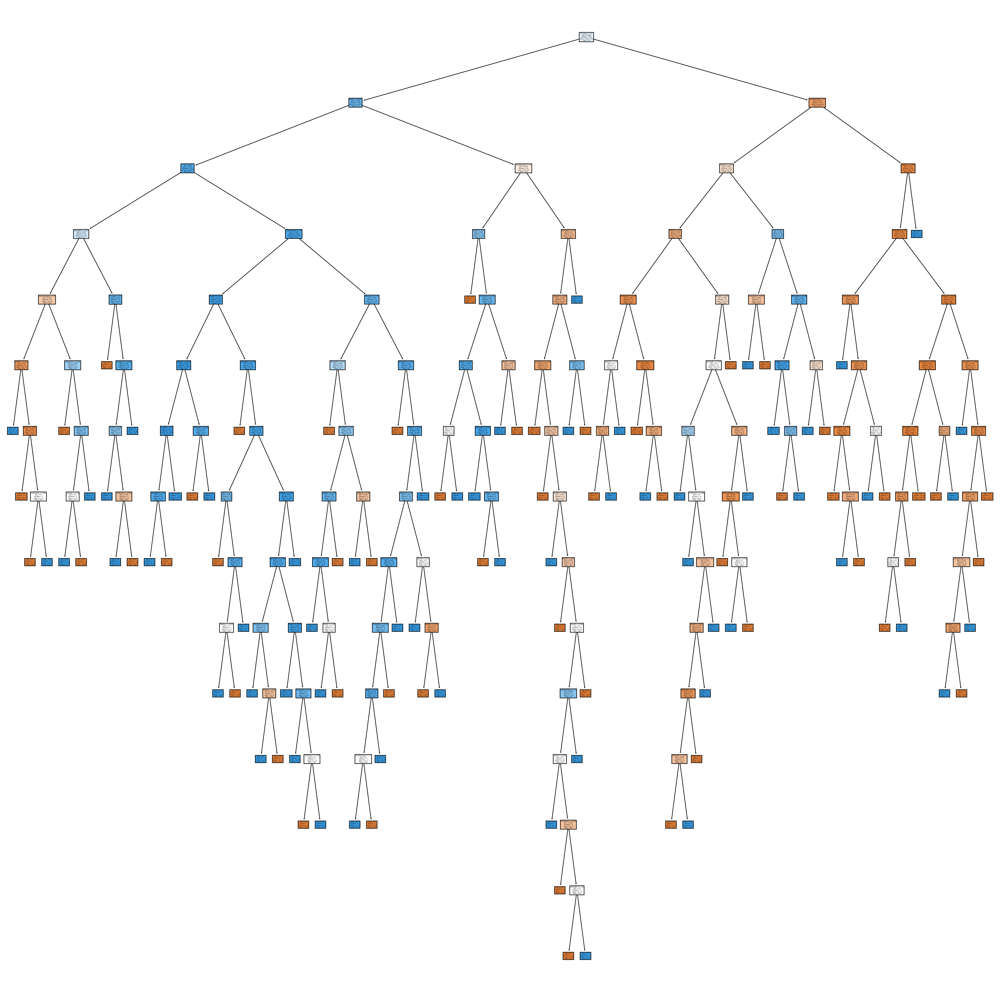

Accuracy: 0.7848101265822784
Error Rate: 0.21518987341772153
Sensitivity: 0.775
Specificity: 0.7948717948717948
precion: 0.7948717948717948
[[31  8]
 [ 9 31]]


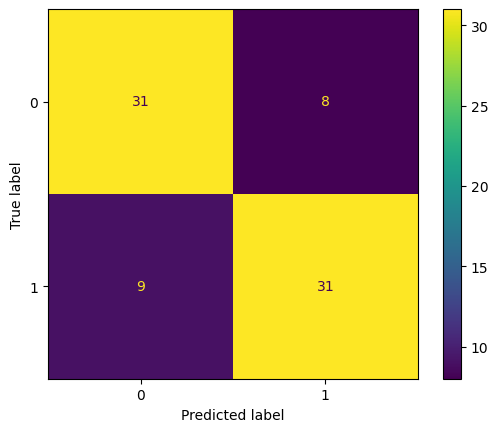

In [8]:
# split dataset in training sat and test set
X_train, X_test, y_train, y_test=train_test_split(X,y, test_size=0.1, random_state=1)

#Building Desition tree model
clf=DecisionTreeClassifier()
clf=clf.fit(X_train,y_train)
y_pred=clf.predict(X_test)

# split dataset in fetures and target variabal
fn=df.keys().tolist()[:-1]
X=df[fn]
y=df['HeartDisease']
#visualizing
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (30,30), dpi=300)

tree.plot_tree(clf,
               feature_names = fn, 
               class_names=["yes","no"], 
               filled = True);

plt.show()

#Model evaluation:
tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()
print ("Accuracy:",metrics.accuracy_score(y_test, y_pred)) 
print("Error Rate:", (fp + fn) / (tp + tn + fp + fn))
print("Sensitivity:", tp / (tp + fn))
print("Specificity:",  tn / (tn + fp))
print ("precion:",metrics.precision_score(y_test, y_pred))

#compute and print the confusion matrix
cm = confusion_matrix(y_test, y_pred)
print(cm)
cn=df ['HeartDisease'].unique() #classes_names
disp = ConfusionMatrixDisplay.from_estimator(clf, X_test, y_test, display_labels=cn)



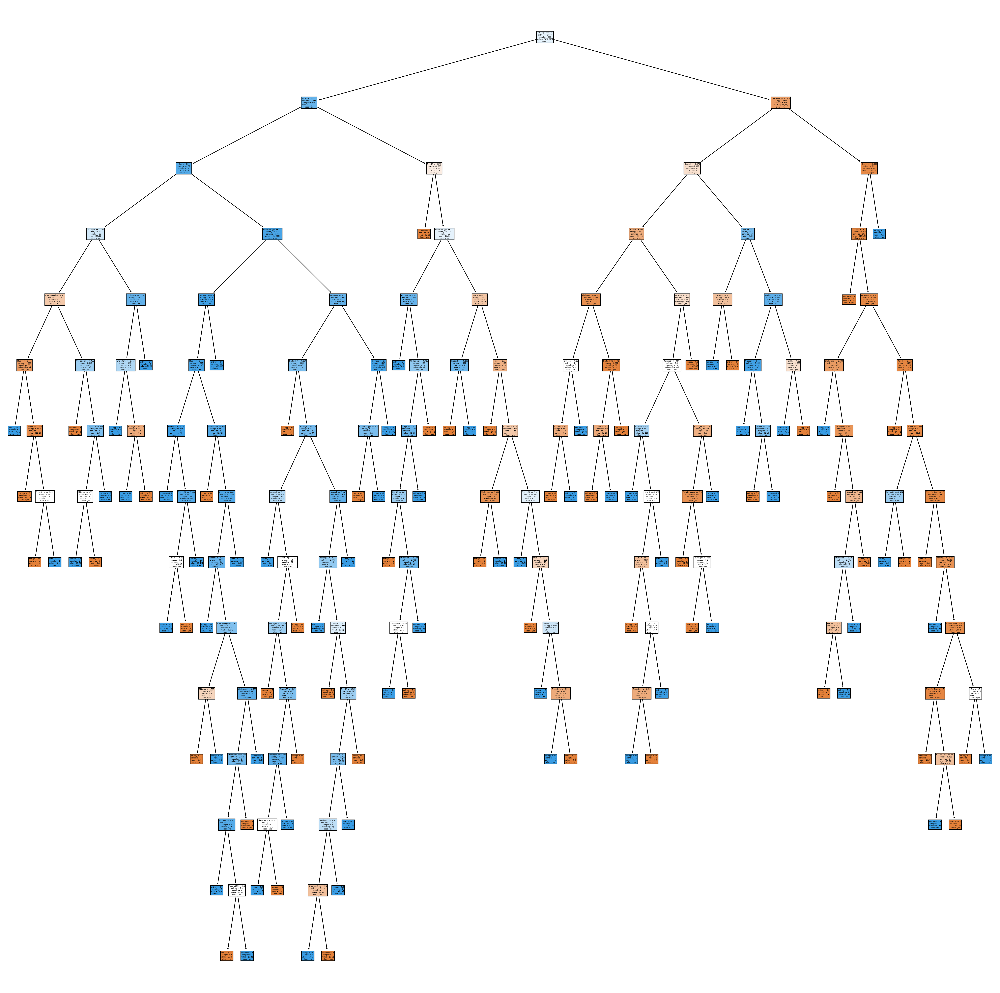

Accuracy: 0.7721518987341772
Error Rate: 0.22784810126582278
Sensitivity: 0.775
Specificity: 0.7692307692307693
precion: 0.775
[[30  9]
 [ 9 31]]


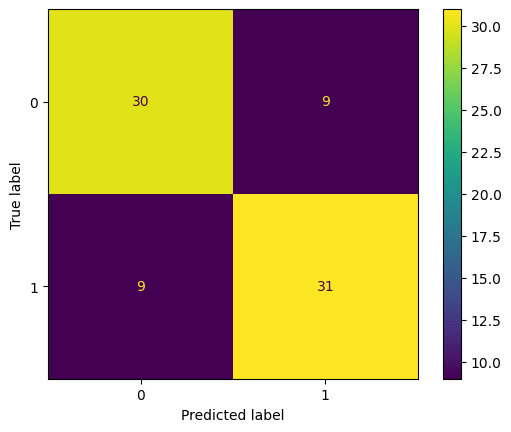

In [10]:
# split dataset in training sat and test set
X_train, X_test, y_train, y_test=train_test_split(X,y, test_size=0.1, random_state=1)


#Building Desition tree model
clf=DecisionTreeClassifier(criterion="entropy")
clf=clf.fit(X_train,y_train)
y_pred=clf.predict(X_test)

# split dataset in fetures and target variabal
fn=df.keys().tolist()[:-1]
X=df[fn]
y=df['HeartDisease']
#visualizing
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (30,30), dpi=300)

tree.plot_tree(clf,
               feature_names = fn, 
               class_names=["yes","no"], 
               filled = True);

plt.show()

#Model evaluation:
tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()

print ("Accuracy:",metrics.accuracy_score(y_test, y_pred)) 
print("Error Rate:", (fp + fn) / (tp + tn + fp + fn))
print("Sensitivity:", tp / (tp + fn))
print("Specificity:",  tn / (tn + fp))
print ("precion:",metrics.precision_score(y_test, y_pred))


#compute and print the confusion matrix
cm = confusion_matrix(y_test, y_pred)
print(cm)
cn=df ['HeartDisease'].unique() #classes_names
disp = ConfusionMatrixDisplay.from_estimator(clf, X_test, y_test, display_labels=cn)

 In the two decision trees at the top the size of partition was 10% test size and 90% Training size, and we notice that the accuracy is 
more in Giniy

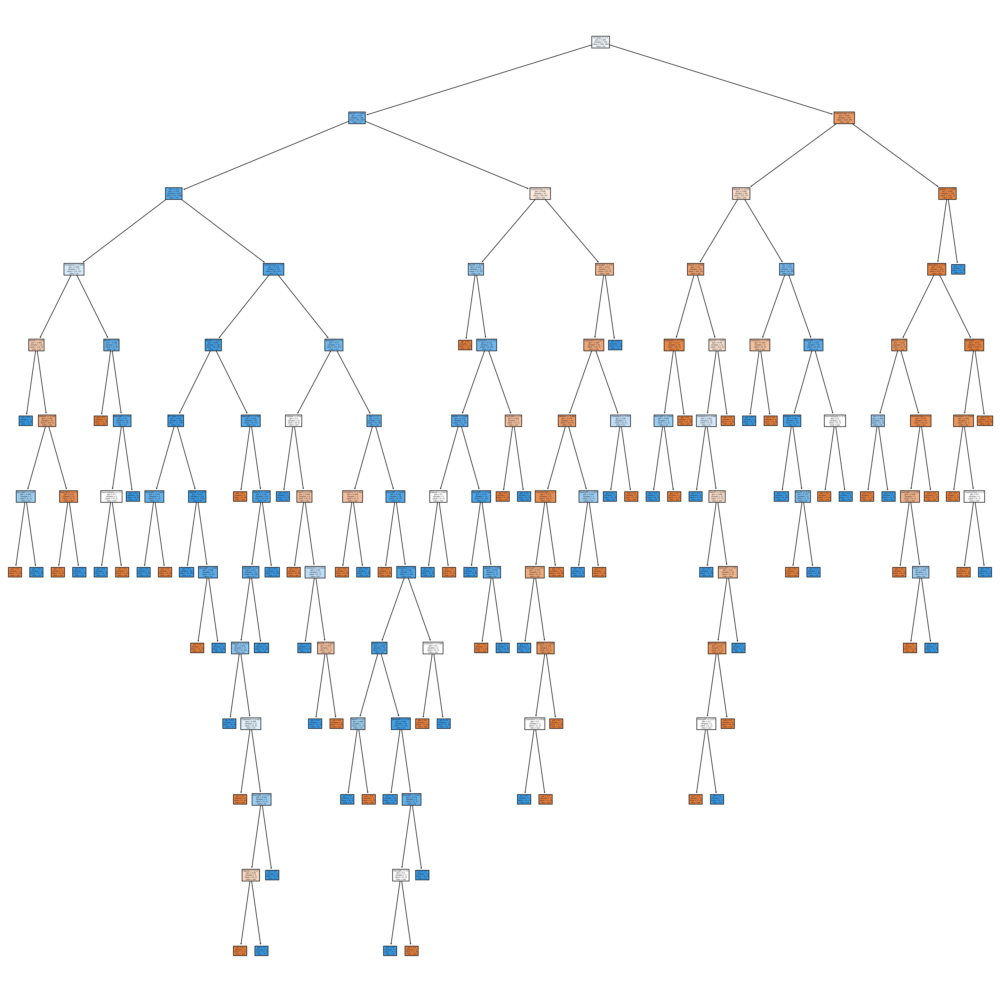

Accuracy: 0.7796610169491526
Error Rate: 0.22033898305084745
Sensitivity: 0.7348484848484849
Specificity: 0.8365384615384616
precion: 0.8508771929824561
[[87 17]
 [35 97]]


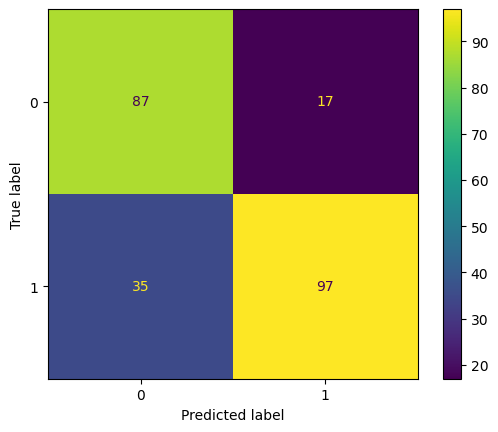

In [5]:
# split dataset in training sat and test set
X_train, X_test, y_train, y_test=train_test_split(X,y, test_size=0.3, random_state=1)


#Building Desition tree model
clf=DecisionTreeClassifier()
clf=clf.fit(X_train,y_train)
y_pred=clf.predict(X_test)

# split dataset in fetures and target variabal
fn=df.keys().tolist()[:-1]
X=df[fn]
y=df['HeartDisease']
#visualizing
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (30,30), dpi=300)

tree.plot_tree(clf,
               feature_names = fn, 
               class_names=["yes","no"], 
               filled = True);

plt.show()

#Model evaluation:
tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()

print ("Accuracy:",metrics.accuracy_score(y_test, y_pred)) 
print("Error Rate:", (fp + fn) / (tp + tn + fp + fn))
print("Sensitivity:", tp / (tp + fn))
print("Specificity:",  tn / (tn + fp))
print ("precion:",metrics.precision_score(y_test, y_pred))


#compute and print the confusion matrix
cm = confusion_matrix(y_test, y_pred)
print(cm)
cn=df ['HeartDisease'].unique() #classes_names
disp = ConfusionMatrixDisplay.from_estimator(clf, X_test, y_test, display_labels=cn)

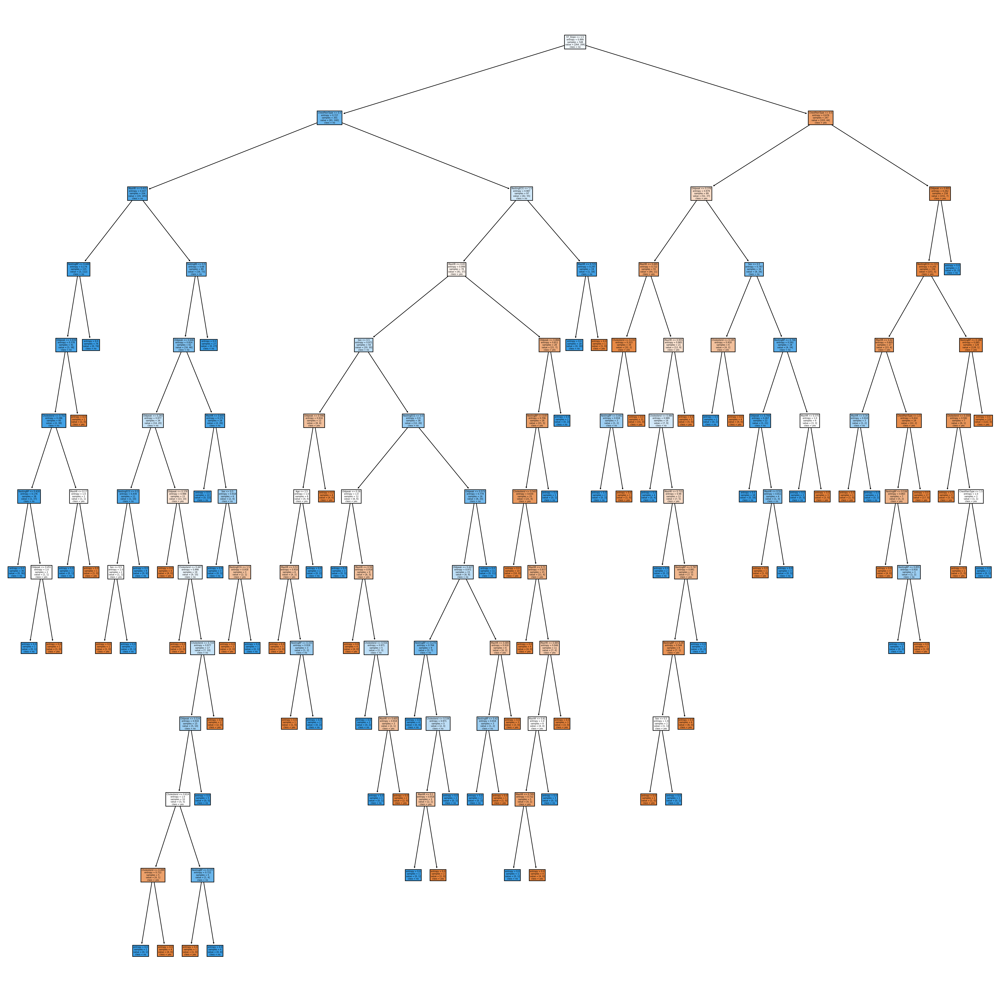

Accuracy: 0.7838983050847458
Error Rate: 0.21610169491525424
Sensitivity: 0.7575757575757576
Specificity: 0.8173076923076923
precion: 0.8403361344537815
[[ 85  19]
 [ 32 100]]


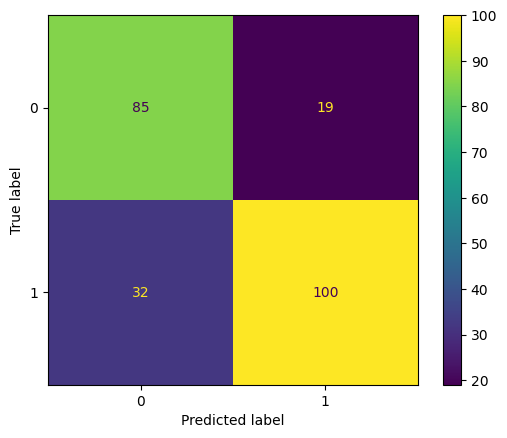

In [6]:
# split dataset in training sat and test set
X_train, X_test, y_train, y_test=train_test_split(X,y, test_size=0.3, random_state=1)


#Building Desition tree model
clf=DecisionTreeClassifier(criterion="entropy")
clf=clf.fit(X_train,y_train)
y_pred=clf.predict(X_test)

# split dataset in fetures and target variabal
fn=df.keys().tolist()[:-1]
X=df[fn]
y=df['HeartDisease']
#visualizing
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (30,30), dpi=300)

tree.plot_tree(clf,
               feature_names = fn, 
               class_names=["yes","no"], 
               filled = True);

plt.show()

#Model evaluation:
tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()

print ("Accuracy:",metrics.accuracy_score(y_test, y_pred)) 
print("Error Rate:", (fp + fn) / (tp + tn + fp + fn))
print("Sensitivity:", tp / (tp + fn))
print("Specificity:",  tn / (tn + fp))
print ("precion:",metrics.precision_score(y_test, y_pred))


#compute and print the confusion matrix
cm = confusion_matrix(y_test, y_pred)
print(cm)
cn=df ['HeartDisease'].unique() #classes_names
disp = ConfusionMatrixDisplay.from_estimator(clf, X_test, y_test, display_labels=cn)

In the two decision trees at the top the size of partition was 30% test size and 70% Training size, and we notice that the accuracy 
is more in IG

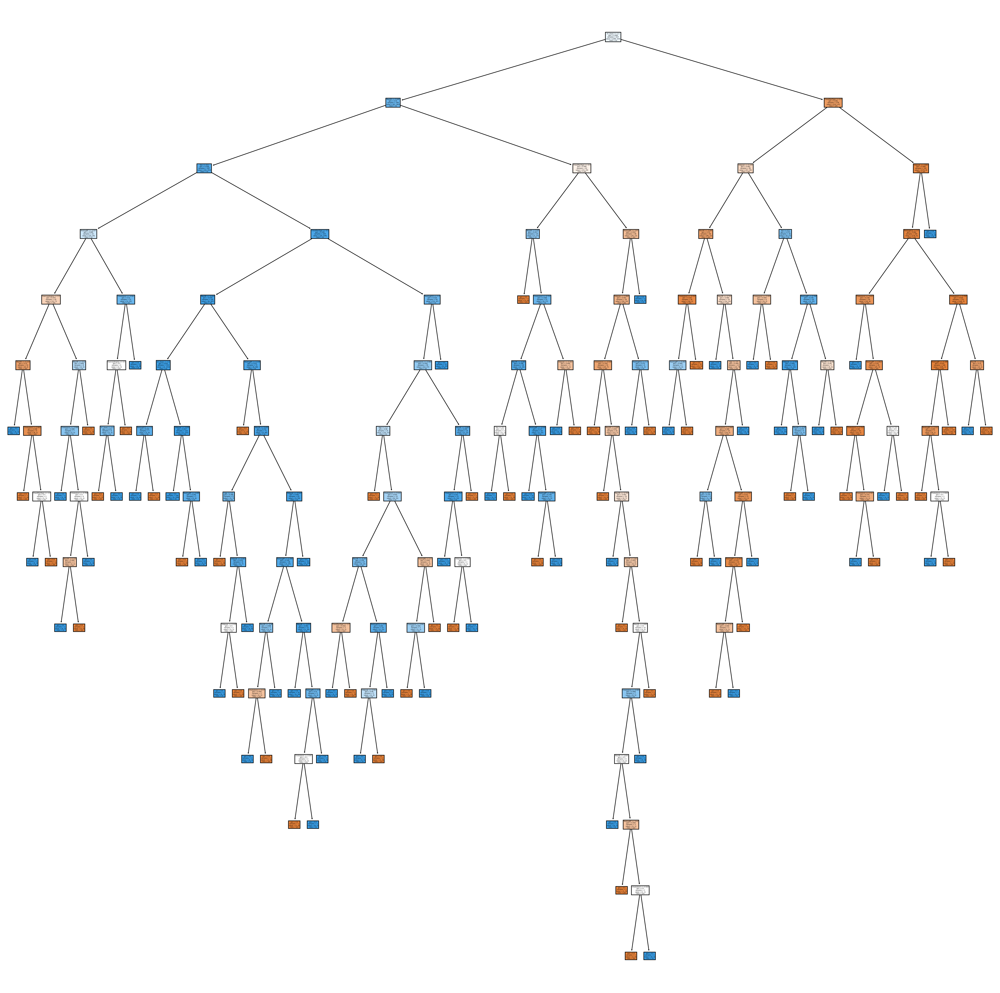

Accuracy: 0.7961783439490446
Error Rate: 0.20382165605095542
Sensitivity: 0.7701149425287356
Specificity: 0.8285714285714286
precion: 0.8481012658227848
[[58 12]
 [20 67]]


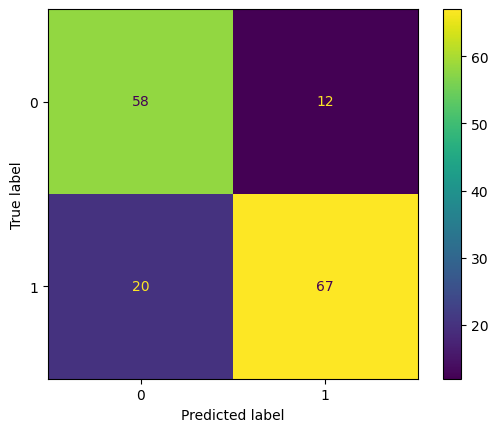

In [7]:
# split dataset in training sat and test set
X_train, X_test, y_train, y_test=train_test_split(X,y, test_size=0.2, random_state=1)


#Building Desition tree model
clf=DecisionTreeClassifier()
clf=clf.fit(X_train,y_train)
y_pred=clf.predict(X_test)

# split dataset in fetures and target variabal
fn=df.keys().tolist()[:-1]
X=df[fn]
y=df['HeartDisease']
#visualizing
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (30,30), dpi=300)

tree.plot_tree(clf,
               feature_names = fn, 
               class_names=["yes","no"], 
               filled = True);

plt.show()
#Model evaluation:
tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()

print ("Accuracy:",metrics.accuracy_score(y_test, y_pred)) 
print("Error Rate:", (fp + fn) / (tp + tn + fp + fn))
print("Sensitivity:", tp / (tp + fn))
print("Specificity:",  tn / (tn + fp))
print ("precion:",metrics.precision_score(y_test, y_pred))


#compute and print the confusion matrix
cm = confusion_matrix(y_test, y_pred)
print(cm)
cn=df ['HeartDisease'].unique() #classes_names
disp = ConfusionMatrixDisplay.from_estimator(clf, X_test, y_test, display_labels=cn)

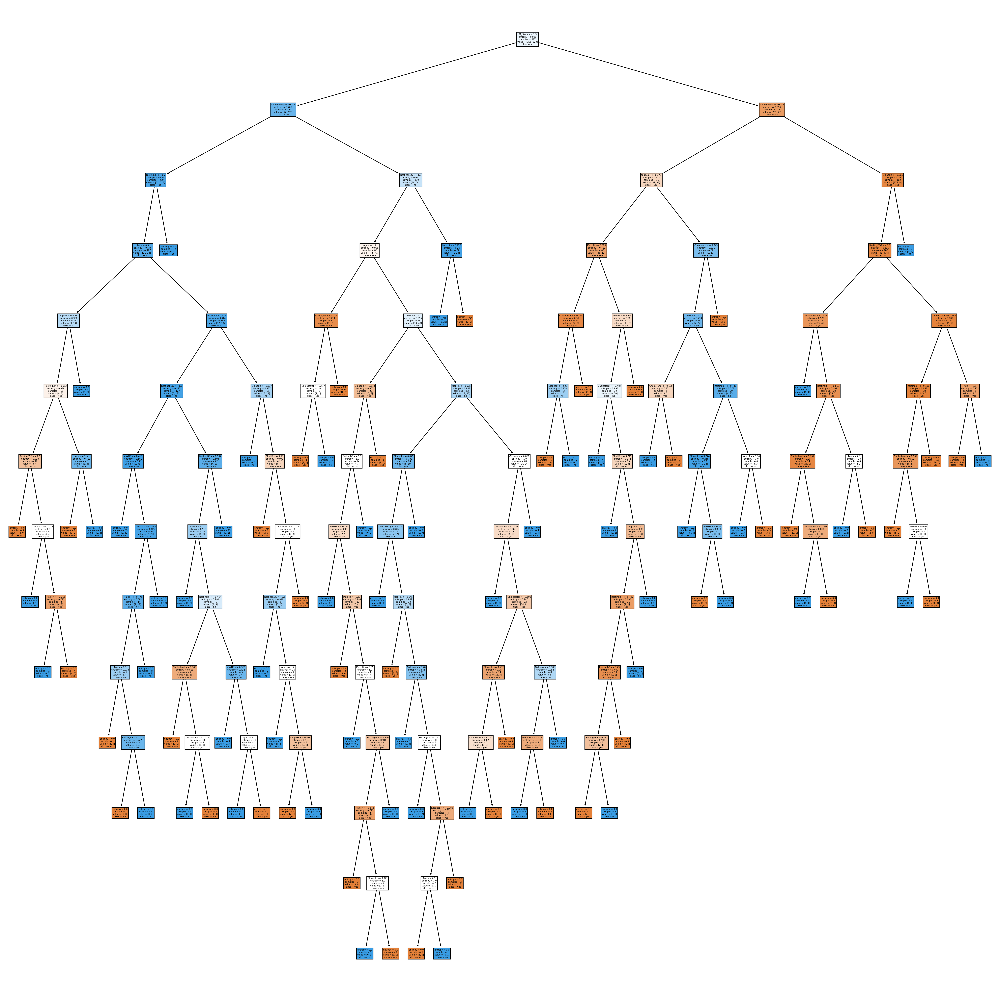

Accuracy: 0.7834394904458599
Error Rate: 0.21656050955414013
Sensitivity: 0.7241379310344828
Specificity: 0.8571428571428571
precion: 0.863013698630137
[[60 10]
 [24 63]]


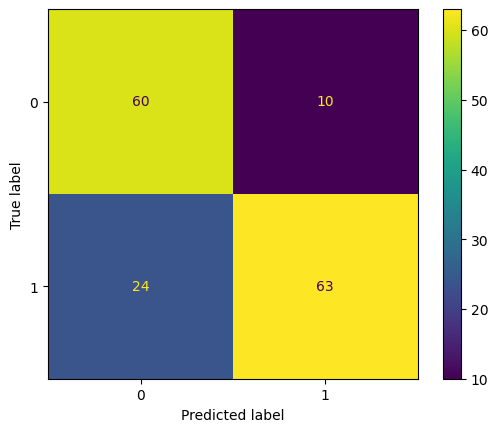

In [8]:
# split dataset in training sat and test set
X_train, X_test, y_train, y_test=train_test_split(X,y, test_size=0.2, random_state=1)


#Building Desition tree model
clf=DecisionTreeClassifier(criterion="entropy")
clf=clf.fit(X_train,y_train)
y_pred=clf.predict(X_test)

# split dataset in fetures and target variabal
fn=df.keys().tolist()[:-1]
X=df[fn]
y=df['HeartDisease']
#visualizing
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (30,30), dpi=300)

tree.plot_tree(clf,
               feature_names = fn, 
               class_names=["yes","no"], 
               filled = True);

plt.show()
#Model evaluation:
tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()

print ("Accuracy:",metrics.accuracy_score(y_test, y_pred)) 
print("Error Rate:", (fp + fn) / (tp + tn + fp + fn))
print("Sensitivity:", tp / (tp + fn))
print("Specificity:",  tn / (tn + fp))
print ("precion:",metrics.precision_score(y_test, y_pred))


#compute and print the confusion matrix
cm = confusion_matrix(y_test, y_pred)
print(cm)
cn=df ['HeartDisease'].unique() #classes_names
disp = ConfusionMatrixDisplay.from_estimator(clf, X_test, y_test, display_labels=cn)

In the two decision trees at the top the size of partition was 20% test size and 80% Training size, and we notice that the accuracy 
is more in gini

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA

# Load and prepare data
data_path = '3preprocessed_data.csv'  # Replace with your actual data file path
data = pd.read_csv(data_path)
# Remove the class column, assuming it is named 'Class'
features = data.drop(columns=['Class'], axis=1)  # Adjust the column name as per your dataset

# Function to apply K-means clustering and calculate inertia and silhouette score
def cluster_data(k):
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(features)
    inertia = kmeans.inertia_
    silhouette = silhouette_score(features, kmeans.labels_)
    print(f'K={k}: Inertia={inertia}, Silhouette={silhouette}')
    return inertia, silhouette, kmeans

# Evaluate clustering for a range of K values to determine the optimal number of clusters
k_values = range(2, 11)  # Exploring a wider range of K values
results = {}
for k in k_values:
    results[k] = cluster_data(k)

# Plotting results: Elbow method and Silhouette scores
ks = np.array(list(results.keys()))
inertias = np.array([result[0] for result in results.values()])
silhouettes = np.array([result[1] for result in results.values()])

plt.figure(figsize=(14, 6))
plt.subplot(1, 2, 1)
plt.plot(ks, inertias, '-o')
plt.title('Elbow Method')
plt.xlabel('Number of clusters (K)')
plt.ylabel('Inertia')
plt.xticks(ks)

plt.subplot(1, 2, 2)
plt.plot(ks, silhouettes, '-o', color='red')
plt.title('Silhouette Scores by K')
plt.xlabel('Number of clusters (K)')
plt.ylabel('Silhouette Score')
plt.xticks(ks)
plt.tight_layout()
plt.show()

# Function to perform PCA and plot clusters
def plot_clusters_pca(k, kmeans):
    labels = kmeans.labels_
    pca = PCA(n_components=2)
    pca_result = pca.fit_transform(features)
    
    plt.figure(figsize=(8, 6))
    scatter = plt.scatter(pca_result[:, 0], pca_result[:, 1], c=labels, cmap='viridis', label=np.unique(labels))
    plt.title(f'PCA-Reduced Data Clustered into {k} Groups')
    plt.xlabel('Principal Component 1')
    plt.ylabel('Principal Component 2')
    plt.colorbar(scatter, label='Cluster Label')
    plt.show()

# Visualize PCA-reduced clusters for K values in the explored range
for k in k_values:
    inertia, silhouette, kmeans = results[k]
    plot_clusters_pca(k, kmeans)clustring

In [12]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler


In [ ]:
data_path = '3preprocessed_data.csv'  # Adjust the path
data = pd.read_csv(data_path)
features = data.drop(columns=['HeartDisease'])

specifying the path to our dataset, reading the dataset into a DataFrame using Pandas, and then removing the 'HeartDisease' column to isolate the features used for clustering. This process ensures that the data is prepared without any target variable influence, making it suitable for unsupervised learning tasks like K-means clustering.

In [ ]:
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features)

using the StandardScaler from scikit-learn, a crucial step in data preprocessing especially for algorithms like K-means that are sensitive to the scale of input data.

In [20]:
def cluster_data(k):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(features_scaled)
    inertia = kmeans.inertia_
    silhouette = silhouette_score(features_scaled, kmeans.labels_) if k > 1 else -1
    return inertia, silhouette, kmeans
k_range = range(2, 11)
results = {k: cluster_data(k) for k in k_range}

/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super

def cluster_data(k):
Defines a function to apply K-means clustering given k, the number of clusters. It fits the model to the scaled features, computes the model's inertia, and calculates the silhouette score if k is greater than 1.
k_range = range(2, 11):
Sets up a range of cluster counts from 2 to 10 for analysis.
results = {k: cluster_data(k) for k in k_range}:
Executes the clustering function across the specified range and stores the results (inertia, silhouette score, and model) in a dictionary for each cluster count.
This segment efficiently handles clustering with varying cluster sizes, evaluating each configuration based on its cohesion and separation qualities.

In [34]:
print("K-Means Clustering Metrics:")
for k in k_range:
    print(f"K = {k}: Inertia = {results[k][0]}, Silhouette = {results[k][1]}")

K-Means Clustering Metrics:
K = 2: Inertia = 6945.635213379865, Silhouette = 0.18791654211461215
K = 3: Inertia = 6333.356653891398, Silhouette = 0.1789440351771225
K = 4: Inertia = 5800.545279018008, Silhouette = 0.15975110338328263
K = 5: Inertia = 5481.127731865022, Silhouette = 0.16126957413614387
K = 6: Inertia = 5267.0169929470485, Silhouette = 0.1565716191578228
K = 7: Inertia = 5051.651349301543, Silhouette = 0.15632795513791026
K = 8: Inertia = 4919.001918883268, Silhouette = 0.14571237057824524
K = 9: Inertia = 4719.683953080366, Silhouette = 0.13287725389930646
K = 10: Inertia = 4580.617088885884, Silhouette = 0.12233530130179494


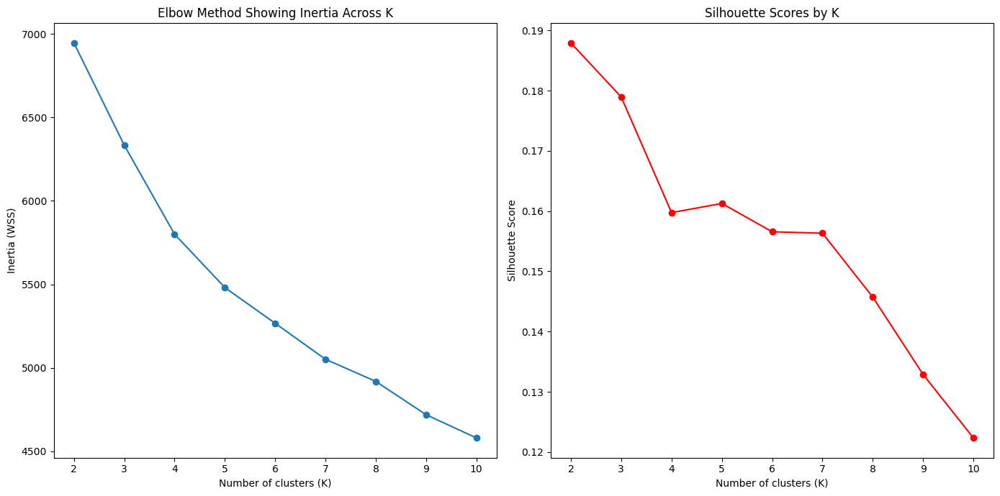

In [35]:
plt.figure(figsize=(14, 7))

plt.subplot(1, 2, 1)
plt.plot(k_range, [results[k][0] for k in k_range], '-o')
plt.title('Elbow Method Showing Inertia Across K')
plt.xlabel('Number of clusters (K)')
plt.ylabel('Inertia (WSS)')

plt.subplot(1, 2, 2)
plt.plot(k_range, [results[k][1] for k in k_range], '-o', color='red')
plt.title('Silhouette Scores by K')
plt.xlabel('Number of clusters (K)')
plt.ylabel('Silhouette Score')

plt.tight_layout()
plt.show()


 visualizing clustering results using Principal Component Analysis (PCA) to reduce the dimensionality of the data. This enables plotting and visual interpretation in a 2D space:

Elbow Method Graph (Left):
The plot displays a steady decrease in inertia (WSS - Within Sum of Squares) as the number of clusters increases.
A sharp drop in inertia is noted from K=2 to K=3, followed by progressively smaller decreases, indicating diminishing gains in cluster compactness.
The "elbow" point, where the rate of decrease in inertia levels off, seems to occur around K=3, suggesting that increasing the number of clusters beyond this might not yield significantly tighter clusters.

Silhouette Score Graph (Right):
The Silhouette scores start relatively high at K=2, showing a peak value, suggesting good cluster separation and cohesion at this point.
There is a noticeable decline in Silhouette scores as more clusters are added, with minor fluctuations but generally decreasing trends, indicating that the quality of clustering (in terms of how distinct the clusters are relative to each other) diminishes as more clusters are introduced.
The scores significantly drop after K=5, suggesting that clusters become less defined and more mixed as the number of clusters increases.

The results suggest that smaller numbers of clusters (specifically around K=2 to K=3) provide a better balance of cluster tightness and separation.
Optimal clustering, based on the provided metrics, likely occurs at around K=3, where the benefits of additional clusters begin to diminish according to the Elbow Method, and the Silhouette Score is relatively high, indicating effective clustering without excessive overlap or dispersion.

In [41]:

print("\nSelected Best Three K Values:")
for k in best_ks:
    print(f"K = {k} with Silhouette = {results[k][1]}")



Selected Best Three K Values:
K = 2 with Silhouette = 0.18791654211461215
K = 3 with Silhouette = 0.1789440351771225
K = 5 with Silhouette = 0.16126957413614387


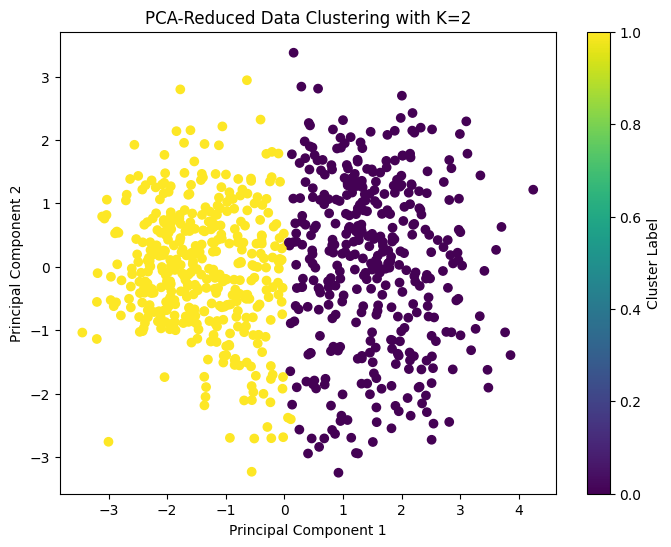

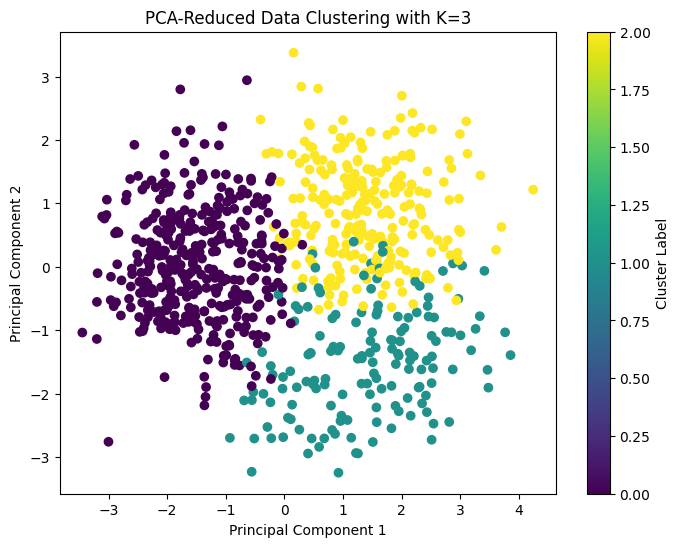

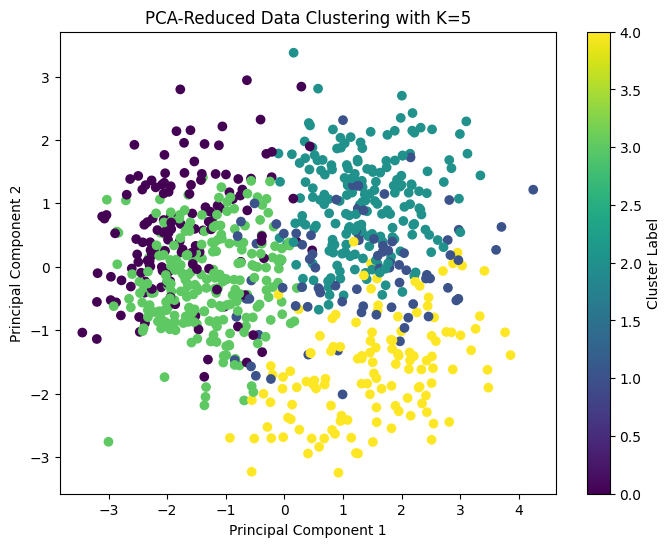

In [42]:

# Optionally, visualize clusters using PCA for selected best K values
def plot_clusters_pca(k):
    kmeans = results[k][2]
    labels = kmeans.labels_
    pca = PCA(n_components=2)
    pca_result = pca.fit_transform(features_scaled)
    
    plt.figure(figsize=(8, 6))
    scatter = plt.scatter(pca_result[:, 0], pca_result[:, 1], c=labels, cmap='viridis')
    plt.title(f'PCA-Reduced Data Clustering with K={k}')
    plt.xlabel('Principal Component 1')
    plt.ylabel('Principal Component 2')
    plt.colorbar(scatter, label='Cluster Label')
    plt.show()

for k in best_ks:
    plot_clusters_pca(k)


PCA-Reduced Data Clustering with K=2:
Silhouette Score: 0.1879

This visualization shows two distinct clusters, each represented by a different color. The highest silhouette score among the three configurations, 0.1879, indicates that the clustering is very effective, with clear separation between the two groups.
PCA-Reduced Data Clustering with K=3:
Silhouette Score: 0.1789

The plot for K=3 features three clusters, each uniquely colored, demonstrating reasonable separation. Although the silhouette score of 0.1789 is slightly lower than K=2, it still suggests that the clusters are well-defined and adequately separated, providing a balanced segmentation of the data.
PCA-Reduced Data Clustering with K=5:
Silhouette Score: 0.1613

With five clusters, this plot reveals finer subdivisions within the data, which might capture more detailed data patterns. The silhouette score of 0.1613, being the lowest among the three, indicates that while the clusters are more detailed, they may overlap or become less distinct, potentially indicating some overfitting or less effective natural groupings.


These visualizations serve as important tools for interpreting the effectiveness of different cluster configurations, providing visual confirmation of the numerical analysis. The silhouette scores further validate the visual impressions, with higher scores generally suggesting clearer and more meaningful separations between clusters. The selection of K=2, K=3, and K=5 for detailed visualization highlights a range of clustering granularities from broad to detailed segmentation.

## 6-Evaluation and comparision

#### For Classification:

In this project, we evaluated six different decision tree models, focusing primarily on accuracy while also considering sensitivity, specificity, and precision. The goal was to select the model that best identifies cases of heart disease.

|   | 90% training set,10%testing set | 90% training set,10%testing set | 80% training set,20%testing set | 80% training set,20%testing set | 70% training set,30%testing set| 70% training set,30%testing set |
|--------|----------|-------------|-------------|-----------|--------|----------|
|  | IG     | Gini index        | IG       | Gini index      | IG   | Gini index     |
| Accuracy    | 0.7721     | 0.7848        | 0.7834       | **0.7962**     | 0.7839   | 0.7796    |

From all decision trees we notice  in the division 80% training set 20% testing set(gini), they have 79.6% accuracy which mean most of tuple covered by the rule are correctly classified by class label.


| Model  | Accuracy | Sensitivity | Specificity | Precision |
|--------|----------|-------------|-------------|-----------|
| Tree 1 Gini(10) | 0.7848   | 0.775      | 0.7948    | 0.7948    |
| Tree 2 IG(10) | 0.7721   | 0.775      | 0.7692     | 0.775    |
| Tree 3 Gini(30) | 0.7796   | 0.7348      | 0.8365      | 0.8509    |
| Tree 4 IG(30)| 0.7839   | 0.7576      | 0.8173      | 0.8403    |
| **Tree 5 Gini(20)** | **0.7962**   | **0.7701**      | **0.8286**      | **0.8481**    |
| Tree 6 IG(20) | 0.7834   | 0.7241      | 0.8571      | 0.8630    |

We extract from the confusion matrix this result that appears in the table, and we notice that in the partition 90% training set that selection measure is Gini has the best algorithm because it has higher accuracy also have higher specificity which means it is better at identifying negative cases compared to tree 2 IG(10).
 while in partition 70% training set and 30% testing set we notice that tree 4(IG) has a better algorithm because it has higher accuracy and also higher sensitivity which means that tree 4 (IG) is better at identifying positive cases compared to tree 3(Gini).
While in partition 80% training set and 20% test set we notice  Tree 5 (Gini) performs better in terms of accuracy and sensitivity which means it is better than tree 6(IG).

Considering all metrics, Tree 5 (Gini) stands out as it has the highest accuracy (0.7962) among all models, while still maintaining relatively good sensitivity, specificity, and precision.
Therefore, based on the provided metrics, Tree 5 (Gini) seems to be the best algorithm overall.

#### For Clustring:
In this project, we evaluated the effectiveness of different clustering setups by analyzing K-means clustering configurations with varying numbers of clusters. We aimed to determine the most meaningful grouping of data that reveals hidden patterns and insights, particularly in how data points are organized based on their similarities.

Cluster Configurations Evaluated:

 • We assessed clustering configurations with K=2, K=3, K=4, K=5, and K=6.
 • Each configuration was evaluated based on its silhouette score, which measures the quality of the clusters formed. A higher silhouette score indicates better-defined clusters that are compact and well-separated from each other.

Detailed Cluster Metrics:

 • K=2 Clusters: Showed a distinct separation but may be too broad for detailed insights.
 • K=3 Clusters: Generally provided a good balance of cluster separation and detail in grouping, making it a strong candidate for optimal clustering.
 • K=4 Clusters and Above: Increasing the number of clusters started to show diminishing returns in silhouette scores, suggesting that finer clusters might be over-segmenting the data.

Results Summary:

 • The silhouette scores for each cluster count provided a quantitative measure of clustering effectiveness.
 • Additionally, the Elbow Method was employed to visualize the change in the within-cluster sum of squares (WSS) as the number of clusters increased. This method helped identify the optimal number of clusters by indicating the point at which adding more clusters does not significantly improve the tightness of the clusters (the ‘elbow point’).


Best Configuration:

 • Considering both the quantitative metrics and the PCA visualizations, the configuration with K=3 clusters was found to be the most effective. It struck a good balance between the detail of the data segmentation and the clarity of the clusters, achieving a higher silhouette score compared to higher cluster counts.
 • Thus, K=3 was selected as the optimal number of clusters for this dataset, effectively capturing the inherent groupings within the data while avoiding over-complication.


Model Performance and Visualization:

 • Visualizations using PCA reduction supported these findings by showing how well the data points in each cluster configuration were grouped.
 • The PCA plots for K=3 clusters often displayed clearer separations compared to higher cluster counts, which tended to overlap more as K increased.

## 7-Finding


#### Classification using Decision Trees
Our analysis using the Decision Tree model has provided crucial insights into the predictors of heart disease. This model was meticulously developed using different attribute selection measures, including entropy and the Gini index, to ensure robustness and reliability. The analysis revealed that factors such as 'Cholesterol', 'MaxHR' (Maximum Heart Rate), and 'Age' are pivotal in predicting the presence of heart disease.

- **Cholesterol**: Higher cholesterol levels were consistently shown to be a significant risk factor for heart disease. This aligns with medical literature, which suggests that elevated cholesterol can lead to atherosclerotic plaque build-up, ultimately increasing the risk of cardiovascular events.
  
- **MaxHR**: The analysis highlighted that lower maximum heart rates during stress tests are associated with higher risks of heart disease, suggesting that patients who are unable to reach a higher max heart rate may have compromised heart function.
  
- **Age**: Age proved to be a critical determinant, with older individuals showing a higher prevalence of heart disease, which is likely due to the cumulative effect of health factors over time.

The Decision Tree model's ability to clearly identify and quantify the importance of these predictors makes it an invaluable tool for medical professionals. It aids in the early screening and identification of high-risk individuals, allowing for earlier intervention and potentially more effective management of heart disease.

### Conclusion
The Decision Tree analysis has not only elucidated key health indicators but also underscored the complexity of heart disease etiology involving multiple interlinked factors. This detailed understanding facilitates targeted preventive measures and refined diagnostic approaches, contributing significantly to the ongoing efforts in heart disease management and prevention.


### for clustering
Our data analysis aimed to identify the optimal clustering configuration for our dataset. We assessed potential setups with K=2, K=3, and K=5 clusters using the K-means algorithm, focusing on optimizing based on the silhouette scores and inertia values.

#### Methods
We evaluated each cluster configuration using two primary criteria:

Silhouette Width: Measures how similar an instance is to its cluster compared to other clusters. A higher silhouette width indicates a better-defined cluster.
Elbow Method: Analyzes the total within-cluster sum of squares (inertia) to identify the 'elbow point'—the number of clusters at which the decrease in inertia begins to level off, suggesting an optimal cluster count.
Results

#### K-Means Clustering Metrics:

K=2:
Inertia: 6945.635
Silhouette Score: 0.1879
Observations: Highest silhouette score, indicating effective clustering but limited to two broad groups.
K=3:
Inertia: 6333.357
Silhouette Score: 0.1789
Observations: Substantial decrease in inertia from K=2 to K=3, suggesting improved tightness and separation of clusters, despite a slight drop in the silhouette score.
K=5:
Inertia: 5481.128
Silhouette Score: 0.1613
Observations: Further reduction in inertia indicates tighter clusters but lower silhouette scores suggest diminishing returns on cluster distinctiveness with more clusters.
Silhouette Scores Across Clusters:

Silhouette scores decrease as the number of clusters increases from K=2 to K=10, typically indicating a trade-off between cluster granularity and coherence.

Elbow Plot Analysis:
Inertia values consistently decrease from K=2 to K=5, with the curve beginning to flatten, suggesting potential optimal cluster points around K=3 or K=5.

### Conclusion
#### Optimal Clusters: 
The analysis suggests that both K=3 and K=5 could be argued as optimal based on different metrics. However, K=3 is favored for its balance between cluster cohesion and separation, highlighted by a significant decrease in inertia and relatively high silhouette score.
K=5 may offer tighter clustering but could lead to over-segmentation as indicated by the lower silhouette scores.
Recommendation: K=3 is recommended as the optimal number of clusters. This choice balances detail and distinctiveness without overly complicating the model, ensuring meaningful and manageable clusters.

## 8-References


kaggle. [Link] (https://www.kaggle.com/datasets/fedesoriano/heart-failure-prediction) .